# Calibrating the Radar Rotation Angles


In [1]:
%load_ext autoreload
%autoreload 2

# find the root of the project
import os
from pathlib import Path

ROOT = Path(os.getcwd()).parent
while not ROOT.joinpath(".git").exists():
    ROOT = ROOT.parent

# add the root to the python path
import sys

sys.path.append(str(ROOT))

import dotenv

dotenv.load_dotenv(ROOT.joinpath(".env"))

False

## Load Some Data


In [2]:
import polars as pl


radar_df = (
    pl.scan_parquet(
        ROOT.joinpath("data", "raw", "*.parquet"),
    )
    .filter(pl.col("epoch_time").dt.month() == 10)
    # .filter(pl.col("ip").str.contains("146"))
    .with_columns(
        pl.arctan2(pl.col("f32_directionY"), pl.col("f32_directionX")).alias("heading"),
        (pl.col("f32_positionX_m") ** 2 + pl.col("f32_positionY_m") ** 2)
        .sqrt()
        .alias("distance"),
    )
    .collect()
)

## Read in the Radar Data


In [3]:
import yaml
import utm
import numpy as np


with open(ROOT / "configuration/radars.yaml", "r") as f:
    radar_meta = yaml.safe_load(f)

for radar in radar_meta.values():
    radar["utm"] = utm.from_latlon(*radar["origin"][::-1])[:2]

    # convert the rotation angle to radians
    radar["angle"] = np.deg2rad(radar["angle"])

## Read in the Lane Centerlines


In [4]:
import geopandas as gpd
from src.geometry import redistribute_vertices, explode_linestring
from shapelysmooth import chaikin_smooth, taubin_smooth

lane_df = gpd.read_file(ROOT / "data/calibration_lane_centers.geojson")
utm_crs = lane_df.estimate_utm_crs()

# for use later
lane_geometry = lane_df.copy()

lane_df = (
    lane_df.to_crs(lane_df.estimate_utm_crs())
    .explode(index_parts=False)
    .reset_index(drop=True)
)

lane_df["geometry"] = (
    lane_df["geometry"]
    .apply(
        taubin_smooth,
        # args=(3,  True)
    )
    .apply(chaikin_smooth, args=(3, True))
    .apply(redistribute_vertices, args=(0.1,))
    # .translate(xoff=0, yoff=0)
)

lane_df_pl = (
    explode_linestring(lane_df)
    .assign(
        x=lambda df: df["points"].x,
        y=lambda df: df["points"].y,
    )
    .drop(columns=["points"])
    .pipe(lambda df: pl.from_pandas(df[["felt:id", "x", "y"]]))
)

In [5]:
lane_df.drop(columns=["points"]).explore(max_zoom=26)

### Build the KD Tree


In [6]:
from scipy.spatial import KDTree

lane_df_pl = lane_df_pl.with_columns(
    (pl.col("x") - pl.col("x").shift(1).backward_fill(limit=1))
    .over("felt:id")
    .alias("x_diff"),
    (pl.col("y") - pl.col("y").shift(1).backward_fill(limit=1))
    .over("felt:id")
    .alias("y_diff"),
).with_columns(
    # find the angle of the line segment
    pl.arctan2(pl.col("y_diff"), pl.col("x_diff")).alias("angle"),
)


class Tree:
    def __init__(self, x, y, angles, dist_bound=3, max_angle_diff=10):
        self.tree = KDTree(np.column_stack([x, y]))
        self._angles = angles
        self._distance_bound = dist_bound
        self._max_angle_diff = max_angle_diff

    def query(
        self,
        pos_arr,
        angles,
    ):
        dist, inds = self.tree.query(
            pos_arr, p=2, distance_upper_bound=self._distance_bound
        )
        keep = dist != np.inf
        angle_diff = np.rad2deg(angles[keep] - self._angles[inds[keep]])
        angle_diff = (angle_diff + 180) % 360 - 180
        keep[keep] = np.abs(angle_diff) < self._max_angle_diff
        return dist[keep]


tree = Tree(
    lane_df_pl["x"].to_numpy(),
    lane_df_pl["y"].to_numpy(),
    lane_df_pl["angle"].to_numpy(),
    dist_bound=6,
    max_angle_diff=10,
)
#

## Define Calibration Functions


In [39]:
from typing import Tuple
from scipy.optimize import minimize


def rotate_vector(pos_arr, heading_arr, angle, offset):
    rot_matrix = np.array(
        [[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]]
    ).squeeze()
    return (rot_matrix @ pos_arr.T).T + offset, heading_arr + angle


def solve_radar(ip: str):
    single_radar_df = (
        radar_df.filter(pl.col("ip") == ip)
        .filter(pl.col("distance").is_between(20, 100))
        .sample(fraction=0.5)
    )
    radar_arr = single_radar_df.with_columns(
        pl.concat_list(
            [
                pl.col("f32_positionX_m"),
                pl.col("f32_positionY_m"),
            ],
        )
        .cast(pl.Array(inner=float, width=2))
        .alias("position_vect")
    )["position_vect"].to_numpy()

    origin = radar_meta[ip]["utm"]
    rot_angle = radar_meta[ip]["angle"]

    max_match = radar_arr.shape[0]

    loss_log = []

    def objective_func(sol: Tuple[float, float, float]):
        rot_angle, *origin_offset = sol

        d = tree.query(
            *rotate_vector(
                radar_arr,
                single_radar_df["heading"].to_numpy(),
                rot_angle,
                offset=np.array(origin) + np.array(origin_offset),
            )
        )

        match_loss = 1 - d.shape[0] / max_match  # the optimal here is 0
        average_d_loss = np.mean(d)  # the optimal here is 0

        # loss_log.append((sol, match_loss, average_d_loss))
        return match_loss + average_d_loss

    sol = minimize(
        objective_func,
        x0=(rot_angle, 0, 0),
        bounds=[
            (rot_angle - np.deg2rad(5), rot_angle + np.deg2rad(5)),
            (-3, 3),
            (-3, 3),
        ],
        tol=1e-9,
    )

    return sol, loss_log

In [40]:
from scipy.optimize import minimize


# solutions = {}

# for ip in ["10.160.7.142"]:
# for ip in radar_meta.keys():
for ip in bad_radars:
    solutions[ip] = solve_radar(ip)

In [41]:
solutions[ip]

(  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
   success: True
    status: 0
       fun: 0.9142218515955953
         x: [ 1.122e+00  1.270e+00 -8.384e-01]
       nit: 31
       jac: [-7.572e-04  6.387e-05  1.473e-05]
      nfev: 332
      njev: 83
  hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>,
 [])

In [42]:
bad_radars = ["10.160.7.137", "10.160.7.141"]

In [43]:
from src.radar import BasicRadar

f = BasicRadar()

plot_radar = "10.160.7.137"

plot_df = radar_df.filter(
    pl.col("ip") == plot_radar,
).sample(
    10_000,
)

optimal_df = plot_df.pipe(
    f.rotate_radars,
    angle_mapping={plot_radar: solutions[plot_radar][0].x[0]},
    # rotations={plot_radar: results[plot_radar]["angle"]},
).pipe(
    f.update_origin,
    origin_dict={
        plot_radar: (
            radar_meta[plot_radar]["utm"][0] + solutions[plot_radar][0].x[1],
            radar_meta[plot_radar]["utm"][1] + solutions[plot_radar][0].x[2],
        )
    },
)

before_df = plot_df.pipe(
    f.rotate_radars,
    angle_mapping={plot_radar: radar_meta[plot_radar]["angle"]},
    # rotations={plot_radar: results[plot_radar]["angle"]},
).pipe(
    f.update_origin,
    origin_dict={
        plot_radar: (radar_meta[plot_radar]["utm"][0], radar_meta[plot_radar]["utm"][1])
    },
)


optimal_df = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(
        optimal_df["utm_x"],
        optimal_df["utm_y"],
    ),
    crs=utm_crs,
)

before_df = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(
        before_df["utm_x"],
        before_df["utm_y"],
    ),
    crs=utm_crs,
)


m = lane_geometry.explore(
    max_zoom=26,
)

m = optimal_df.explore(
    m=m,
    color="red",
)

before_df.explore(
    m=m,
    color="purple",
)

function: rotate_radars took: 0.02102804183959961 seconds
function: update_origin took: 0.008233070373535156 seconds
function: rotate_radars took: 0.003968954086303711 seconds
function: update_origin took: 0.0026831626892089844 seconds


<Axes: xlabel='f32_positionX_m', ylabel='f32_positionY_m'>

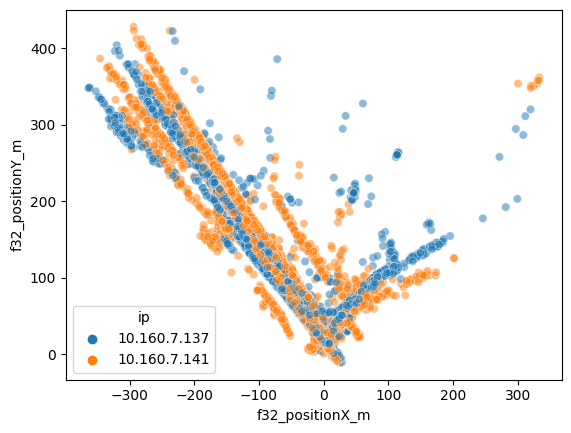

In [28]:
# plot with sns
import seaborn as sns


sns.scatterplot(
    data=radar_df.filter(pl.col("ip").is_in(bad_radars)).sample(10_000).to_pandas(),
    x="f32_positionX_m",
    y="f32_positionY_m",
    hue="ip",
    alpha=0.5,
)

<Axes: xlabel='f32_positionX_m', ylabel='f32_positionY_m'>

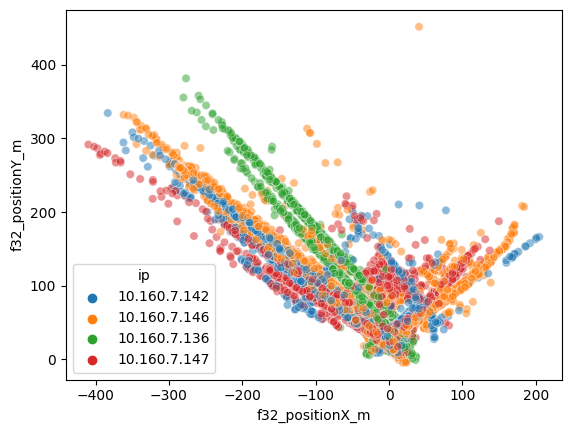

In [29]:
# plot with sns
import seaborn as sns


sns.scatterplot(
    data=radar_df.filter(~pl.col("ip").is_in(bad_radars)).sample(10_000).to_pandas(),
    x="f32_positionX_m",
    y="f32_positionY_m",
    hue="ip",
    alpha=0.5,
)

In [26]:
bad_radars

('10.160.7.137', '10.160.7.141')

In [30]:
for ip, sol in solutions.items():
    print(ip, sol[0].message, sol[0].fun)

10.160.7.137 CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH 2.0590290189335887
10.160.7.136 CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH 0.6929708121502232
10.160.7.141 CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH 1.449253130894478
10.160.7.142 ABNORMAL_TERMINATION_IN_LNSRCH 1.2290562475248503
10.160.7.146 CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH 0.9655599286473882
10.160.7.147 CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH 1.3586565861721085


In [31]:
solutions[plot_radar]

(  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
   success: True
    status: 0
       fun: 1.3586565861721085
         x: [ 3.952e+00  1.500e+00 -9.166e-01]
       nit: 23
       jac: [-6.988e-02 -3.800e-04 -5.908e-04]
      nfev: 176
      njev: 44
  hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>,
 [])

In [32]:
# make dictionary of the solutions
zone_number = utm.from_latlon(*radar_meta[ip]["origin"][::-1])[-2:]
solutions_dict = {
    ip: {
        "angle": float(np.rad2deg(sol[0].x[0])),
        "origin": list(
            map(
                float,
                utm.to_latlon(
                    radar_meta[ip]["utm"][0] + sol[0].x[1],
                    radar_meta[ip]["utm"][1] + sol[0].x[2],
                    *zone_number,
                ),
            )
        ),
    }
    for ip, sol in solutions.items()
}

In [33]:
# write the solutions to a yaml file
import yaml

with open(ROOT / "configuration/october_calibrated.yaml", "w") as f:
    yaml.dump(solutions_dict, f)